In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from plot_ICL import *

### This is the official file with the snow height measurements above all the IceTop tanks

In [2]:
#snow_file = "/data/user/jsaffer/Data/IT81-MasterwithSnowMeasurements-Feb2022.csv"
snow_file = "/data/ana/CosmicRay/IceTop_level3/snow/IT81-MasterwithSnowMeasurements-Mar2023.csv"
snow = pd.read_csv(snow_file, skiprows=1)
snow.replace({'-':np.nan}, inplace=True)
snow = snow.astype({'1-Apr-16': 'float64'}) # there are measurements missing in Apr 2016 which messes with the data type of that column
snow.drop(columns='Unnamed: 9', inplace=True) # there is an empty column that can be removed

In [3]:
snow

,station & tank,Station,Tank,DeployYear,Tank liner,DeployOrder,X,Y,Z,10-Jan-08,...,4-Nov-18,6-Mar-19,23-Nov-19,12-Mar-20,10-Dec-20,5-Mar-21,15-Nov-21,23-Feb-22,23-Nov-22,11-Mar-23
0,01A,1,A,2011,Zirco,76,-265.58,-497.61,1944.70,NaN,...,1.949,1.924,2.200,2.178,2.340,2.420,2.570,2.570,2.879,2.799
1,01B,1,B,2011,Zirco,76,-255.76,-495.79,1944.75,NaN,...,1.703,1.932,2.237,2.238,2.247,2.317,2.387,2.400,2.774,2.749
2,02A,2,A,2009,Zirco,55,-140.41,-477.48,1945.24,NaN,...,1.247,1.247,1.577,1.501,1.593,1.663,1.761,1.763,1.923,1.923
3,02B,2,B,2009,Zirco,55,-130.66,-476.29,1945.22,NaN,...,1.196,1.247,1.400,1.501,1.513,1.583,1.654,1.730,1.940,1.948
4,03A,3,A,2009,Zirco,56,-27.90,-464.26,1945.41,NaN,...,1.477,1.452,1.553,1.553,1.669,1.709,1.870,1.854,1.935,1.908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,79B,79,B,2011,Zirco,79,10.68,-87.90,1946.12,NaN,...,2.217,2.219,2.498,2.549,2.894,2.804,2.834,2.899,2.939,3.029
158,80A,80,A,2011,Tyvek,80,76.53,-42.21,1946.05,NaN,...,1.546,1.902,1.598,1.673,1.858,1.828,1.867,2.002,1.988,2.008
159,80B,80,B,2011,Zirco,80,85.74,-45.73,1946.04,NaN,...,1.422,1.358,1.384,1.384,1.490,1.460,1.453,1.520,1.558,1.591
160,81A,81,A,2011,Tyvek,81,77.36,37.90,1946.18,NaN,...,1.939,1.913,2.142,2.348,2.338,2.348,2.332,2.478,2.552,2.533


### For interpolating the snow height it makes sense to take averages within the stations

In [4]:
snow_avg = pd.DataFrame({'Station':int(len(snow)/2)*[0], 'X':int(len(snow)/2)*[0], 'Y':int(len(snow)/2)*[0], 'Z':int(len(snow)/2)*[0]})

for col in snow.columns:
    if '-' in col and int(col[-2:])>11:
        snow_avg.insert(loc=len(snow_avg.columns), column=col, value=int(len(snow)/2)*[0])

for i in range(int(len(snow)/2)):
    snow_avg['Station'][i] = i+1
    snow_avg['X'][i] = (snow['X'][i*2]+snow['X'][i*2+1])/2
    snow_avg['Y'][i] = (snow['Y'][i*2]+snow['Y'][i*2+1])/2
    snow_avg['Z'][i] = (snow['Z'][i*2]+snow['Z'][i*2+1])/2
    for col in snow.columns:
        if '-' in col and int(col[-2:])>11:
            snow_avg[col][i] = (snow[col][i*2]+snow[col][i*2+1])/2
    
snow_avg

/tmp/ipykernel_881/3032679224.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snow_avg['Y'][i] = (snow['Y'][i*2]+snow['Y'][i*2+1])/2
/tmp/ipykernel_881/3032679224.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snow_avg['Z'][i] = (snow['Z'][i*2]+snow['Z'][i*2+1])/2
/tmp/ipykernel_881/3032679224.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snow_avg[col][i] = (snow[col][i*2]+snow[col][i*2+1])/2
/tmp/ipykernel_881/303267

,Station,X,Y,Z,19-Feb-12,21-Oct-12,9-Jan-13,21-Feb-13,25-Oct-13,11-Dec-13,...,4-Nov-18,6-Mar-19,23-Nov-19,12-Mar-20,10-Dec-20,5-Mar-21,15-Nov-21,23-Feb-22,23-Nov-22,11-Mar-23
0,1,-260.670,-496.700,1944.725,0.2620,0.3770,0.3670,0.3720,0.6620,0.6820,...,1.8260,1.9280,2.2185,2.2080,2.2935,2.3685,2.4785,2.4850,2.8265,2.7740
1,2,-135.535,-476.885,1945.230,0.0830,0.2280,0.2180,0.2330,0.4930,0.4930,...,1.2215,1.2470,1.4885,1.5010,1.5530,1.6230,1.7075,1.7465,1.9315,1.9355
2,3,-24.225,-461.495,1945.345,0.1010,0.2860,0.2610,0.2760,0.3860,0.4010,...,1.4715,1.4715,1.5350,1.5600,1.7460,1.7610,1.9390,1.9185,2.0140,1.9995
3,4,110.400,-437.500,1945.265,0.2535,0.4935,0.4985,0.4785,0.5285,0.5385,...,1.4405,1.5040,1.6055,1.5800,1.7285,1.7335,1.8875,1.9525,2.0415,2.0755
4,5,217.080,-428.390,1945.390,0.1500,0.2950,0.2800,0.2900,0.3550,0.3600,...,1.0290,1.0410,1.1300,1.2065,1.1950,1.2400,1.2940,1.3550,1.4830,1.5535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,77,-92.285,466.695,1946.915,1.1000,1.2350,1.2600,1.3150,1.4600,1.4550,...,2.4830,2.4705,2.6480,2.6860,2.8690,2.8840,2.9585,3.0450,3.2605,3.2530
77,78,-0.215,498.985,1947.725,0.9010,1.0910,1.1510,1.1510,1.2660,1.2960,...,2.1730,2.2810,2.3920,2.4555,2.5510,2.6910,2.7650,2.7985,2.9060,2.9495
78,79,14.285,-91.365,1946.025,0.3275,0.5125,0.5025,0.5025,0.8525,0.8675,...,2.0825,2.0835,2.3500,2.3120,2.5760,2.5910,2.6110,2.6855,2.7710,2.8125
79,80,81.135,-43.970,1946.045,0.0990,0.1540,0.2190,0.2340,0.2790,0.3190,...,1.4840,1.6300,1.4910,1.5285,1.6740,1.6440,1.6600,1.7610,1.7730,1.7995


## Snow comparison 2012 vs 2018

In [5]:
station_list = []
snow_2012_list = []
snow_2018_list = []

for index, station in enumerate(snow_avg.Station):
    station_list.append(station)
    snow_2012_list.append(snow['21-Oct-12'][index])
    snow_2018_list.append(snow['4-Nov-18'][index])

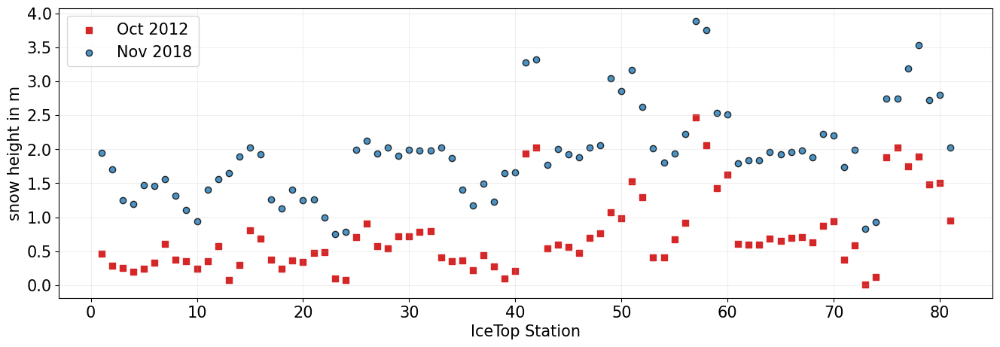

In [6]:
fig = plt.figure(figsize=(16,5))
ax = plt.subplot()

ax.scatter(station_list, snow_2012_list, label='Oct 2012', marker='s', color='C3')
ax.scatter(station_list, snow_2018_list, label='Nov 2018', edgecolor='k', alpha=0.8, color='C0')

ax.set_xlabel('IceTop Station', fontsize=15)
ax.set_ylabel('snow height in m', fontsize=15)
ax.legend(fontsize=15)
ax.tick_params(labelsize=15)
ax.grid(alpha=.2)

plt.show()

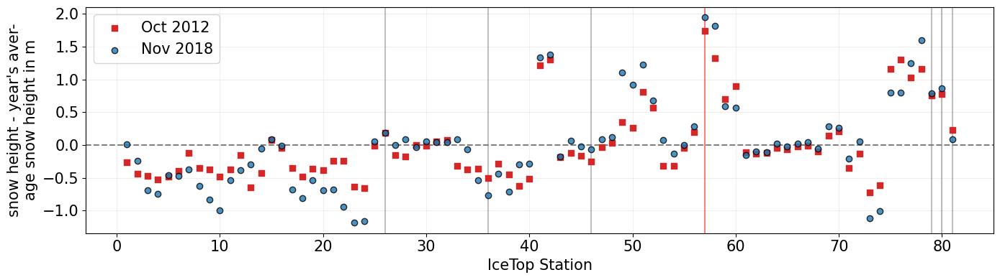

In [7]:
fig = plt.figure(figsize=(14,4))
ax = plt.subplot()

ax.axhline(y=0, color='grey', ls='dashed')
ax.axvline(x=26, color='grey', alpha=0.5)
ax.axvline(x=36, color='grey', alpha=0.5)
ax.axvline(x=46, color='grey', alpha=0.5)
ax.axvline(x=57, color='red', alpha=0.5)
ax.axvline(x=79, color='grey', alpha=0.5)
ax.axvline(x=80, color='grey', alpha=0.5)
ax.axvline(x=81, color='grey', alpha=0.5)

ax.scatter(station_list, np.array(snow_2012_list)-np.mean(snow_2012_list), label='Oct 2012', marker='s', color='C3', zorder=10)
ax.scatter(station_list, np.array(snow_2018_list)-np.mean(snow_2018_list), label='Nov 2018', edgecolor='k', alpha=0.8, color='C0', zorder=11)


ax.set_xlabel('IceTop Station', fontsize=15)
ax.set_ylabel("snow height - year's aver-\nage snow height in m", fontsize=15)
ax.legend(fontsize=15)
ax.tick_params(labelsize=15)
ax.grid(alpha=.2)
plt.tight_layout()

#plt.savefig('/data/user/jsaffer/Plots/snow_heights_2012_2018.png')

plt.show()

## IceTop stations with deployment year

/tmp/ipykernel_1742/3275550168.py:28: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = plt.colorbar(sc)


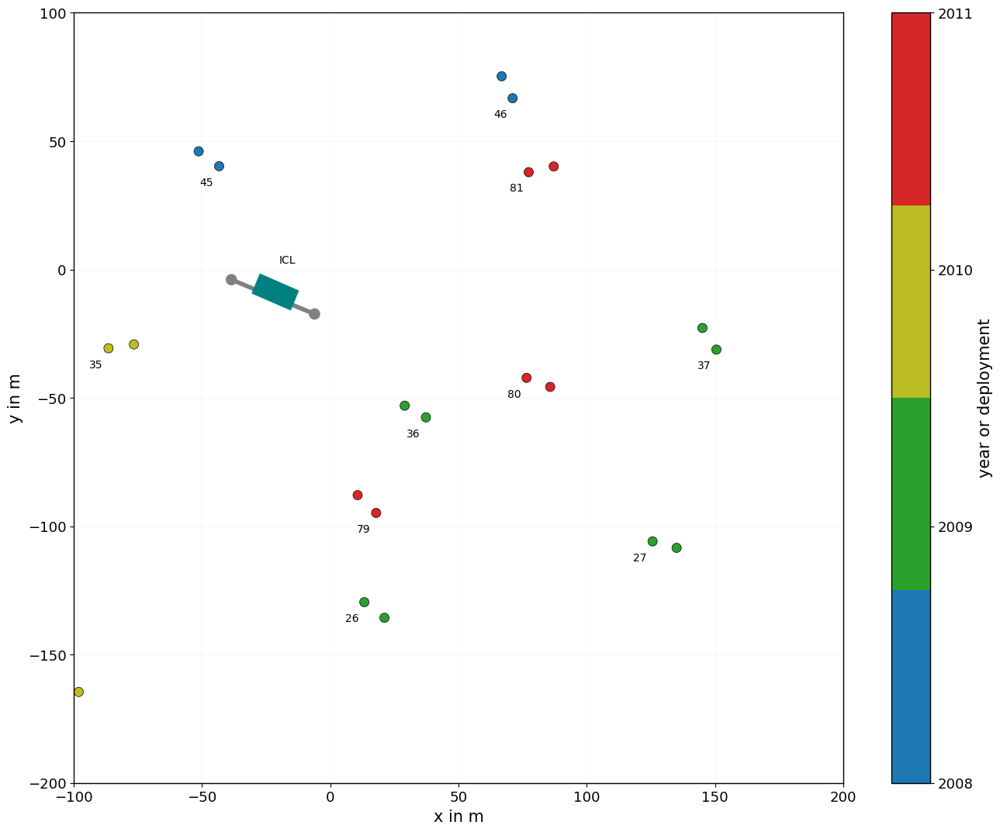

In [4]:
plt.style.use('~/style.txt')

fig = plt.figure(figsize=(16,12.9))
ax = plt.subplot()
ax.axis('equal')

fs=15

from matplotlib.colors import ListedColormap
cmap = ListedColormap(["C0", "C2", "C8", "C3"])

sc = ax.scatter(snow.X, snow.Y, c=snow.DeployYear, cmap=cmap, edgecolors='black', s=75, linewidth=0.5, vmin=2008)
for i in [50, 52, 68, 70, 72, 88, 90, 156, 158, 160]:
    if snow.Tank[i] == 'A':
        ax.text(snow.X[i]-7.5, snow.Y[i]-7.5, snow.Station[i])
        
ax.text(-20, 2.5, 'ICL')

plot_ICL(ax)
#ax.spines.right.set_visible(False)
#ax.spines.top.set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=fs-2)
ax.set_xlabel('x in m', size=fs)
ax.set_ylabel('y in m', size=fs)
ax.set_xlim(-100, 200)
ax.set_ylim(-200, 100)
#ax.axis('equal')
cb = plt.colorbar(sc)
cb.set_ticks([2008, 2009, 2010, 2011])
cb.set_label(label='year or deployment', size=fs)
cb.ax.tick_params(labelsize=fs-2)

#plt.savefig('/data/user/jsaffer/Plots/IceTop_map_deployment_years_InFill.png', dpi=300)

plt.show()

/tmp/ipykernel_1742/764873678.py:26: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = plt.colorbar(sc)


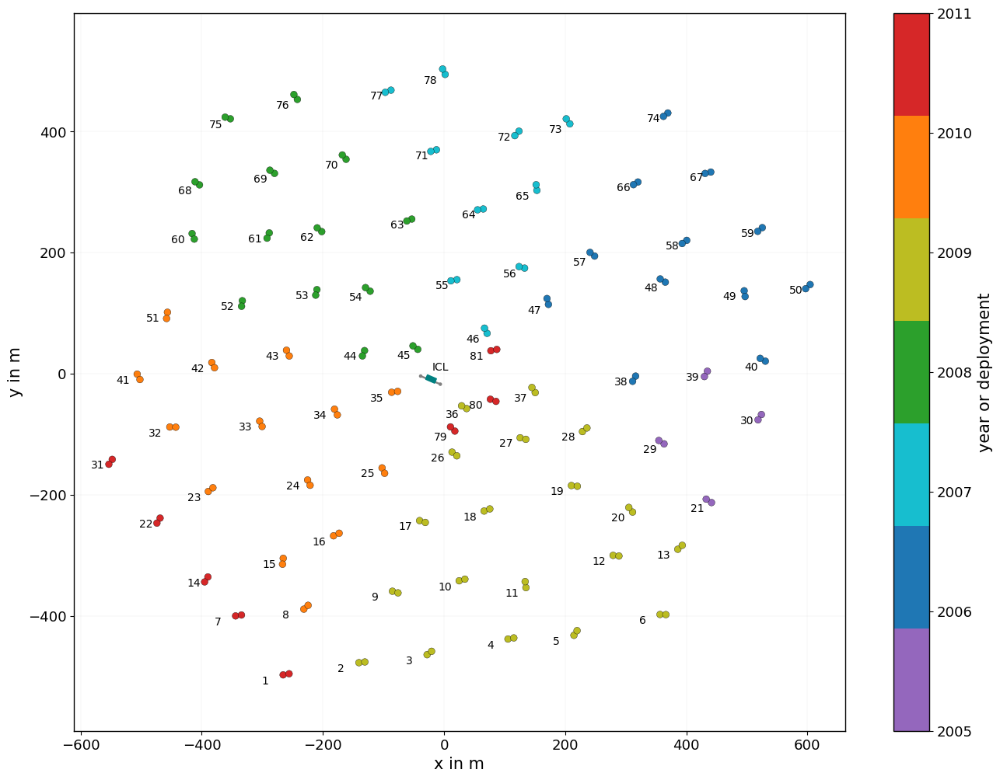

In [5]:
plt.style.use('~/style.txt')

fig = plt.figure(figsize=(16,12))
ax = plt.subplot()
ax.axis('equal')

fs=15

from matplotlib.colors import ListedColormap
cmap = ListedColormap(["C4", "C0", "C9", "C2", "C8", "C1", "C3"])

sc = ax.scatter(snow.X, snow.Y, c=snow.DeployYear, cmap=cmap, edgecolors='black', s=40, linewidth=0.25)
for i in range(len(snow)):
    if snow.Tank[i] == 'A':
        ax.text(snow.X[i]-35, snow.Y[i]-15, snow.Station[i])
        
ax.text(-20, 5, 'ICL')

plot_ICL(ax)
#ax.spines.right.set_visible(False)
#ax.spines.top.set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=fs-2)
ax.set_xlabel('x in m', size=fs)
ax.set_ylabel('y in m', size=fs)
ax.axis('equal')
cb = plt.colorbar(sc)
cb.set_label(label='year or deployment', size=fs)
cb.ax.tick_params(labelsize=fs-2)

#plt.savefig('/data/user/jsaffer/Plots/IceTop_map_deployment_years.png', dpi=300)

plt.show()

### Snow height measurements at the InFill tanks over time

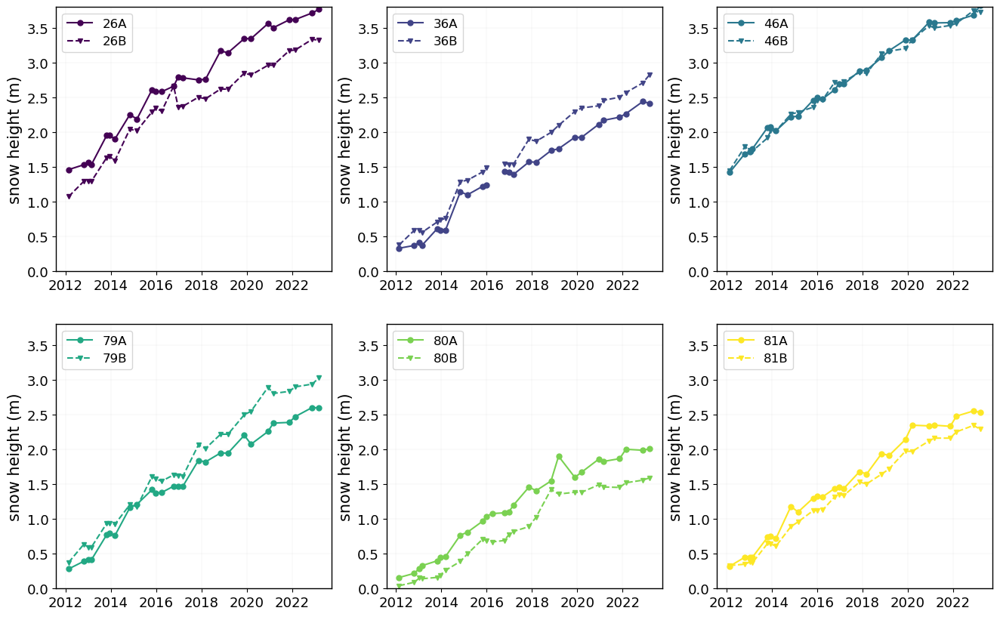

In [6]:
fig = plt.figure(figsize=(16,10))
ax1 = plt.subplot(2,3,1)
ax2 = plt.subplot(2,3,2)
ax3 = plt.subplot(2,3,3)
ax4 = plt.subplot(2,3,4)
ax5 = plt.subplot(2,3,5)
ax6 = plt.subplot(2,3,6)

#plt.suptitle('InFill station snow height measurements', fontsize=fs)

axs = [ax1, ax2, ax3, ax4, ax5, ax6]
stations = [26, 36, 46, 79, 80, 81]
colors = ['#440154', '#414487', '#2A788E', '#22A884', '#7AD151', '#FDE725']

for i in range(6):
    ax = axs[i]
    ax.tick_params(axis='both', which='major', labelsize=fs-2)
    ax.plot(pd.to_datetime(snow.keys()[16:]), snow[snow["station & tank"] == str(stations[i])+"A"].values[0][16:], 'o-',  markersize=5, color=colors[i], label=str(stations[i])+'A')
    ax.plot(pd.to_datetime(snow.keys()[16:]), snow[snow["station & tank"] == str(stations[i])+"B"].values[0][16:], 'v--', markersize=5, color=colors[i], label=str(stations[i])+'B')
    ax.set_ylabel('snow height (m)', size=fs)
    ax.set_ylim(0, 3.8)
    ax.legend(loc='upper left', fontsize=fs-3)
    ax.grid(alpha=0.3)

plt.show()

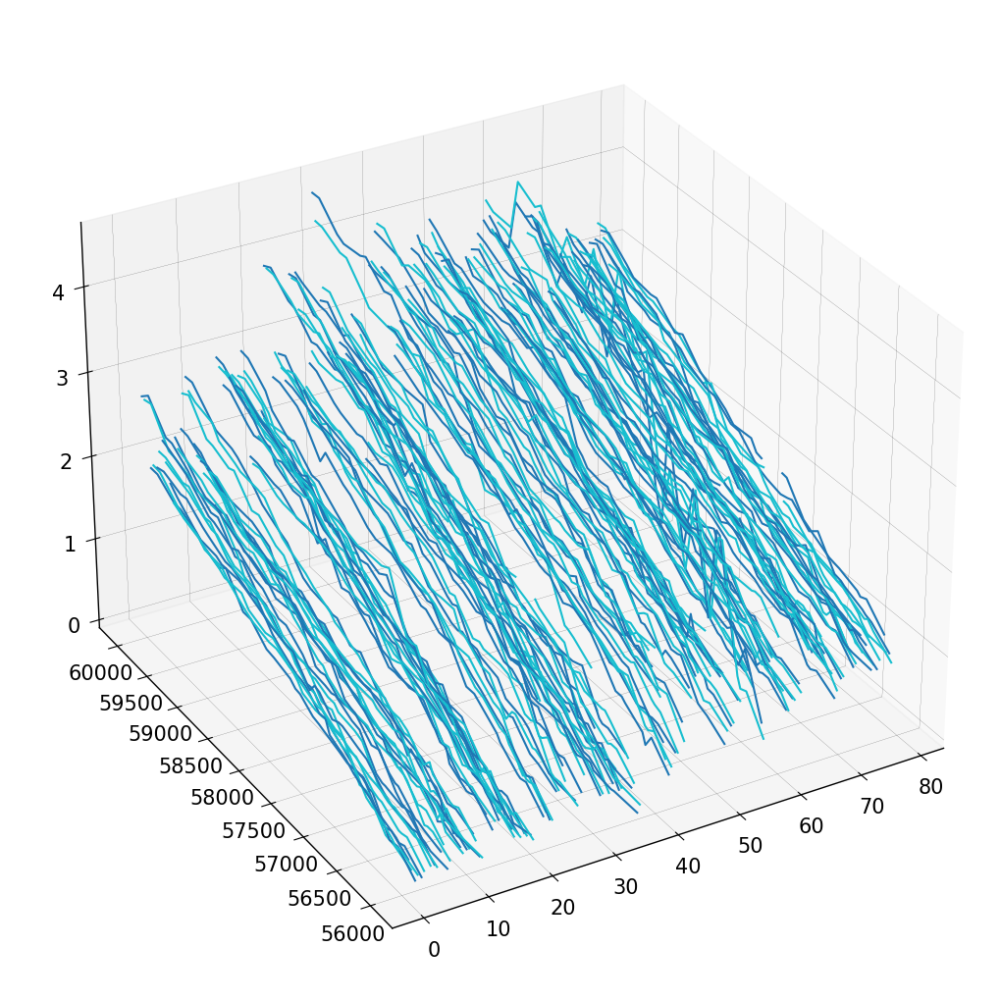

In [7]:
from mpl_toolkits.mplot3d import Axes3D
from astropy.time import Time

t = pd.to_datetime(snow.keys()[16:])

fig = plt.figure(figsize=(10,10))
ax = Axes3D(fig, auto_add_to_figure=False, elev=30, azim=240)
fig.add_axes(ax)

for station in range(1, 79):
    ax.plot((station-0.2)*np.ones(len(snow[snow["station & tank"] == f"{station:02d}A"].values[0][16:])), Time(t).mjd, snow[snow["station & tank"] == f"{station:02d}A"].values[0][16:], '-', color='C0')
    ax.plot((station+0.2)*np.ones(len(snow[snow["station & tank"] == f"{station:02d}B"].values[0][16:])), Time(t).mjd, snow[snow["station & tank"] == f"{station:02d}B"].values[0][16:], '-', color='C9')
          
plt.show()

### Snow height map for a certain time

/tmp/ipykernel_1742/1886655445.py:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc)


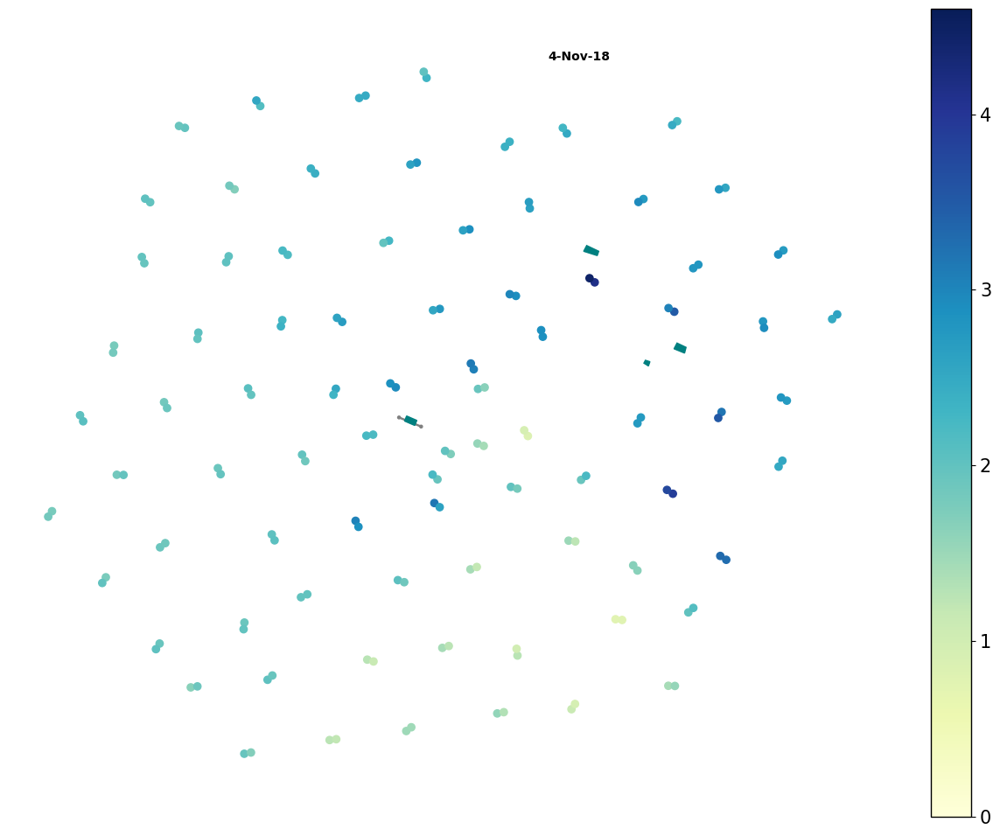

In [8]:
fs=15

fig = plt.figure(figsize=(16,12))
ax = plt.subplot()
plot_ICL(ax)
plot_DSL(ax)
plot_MAPO(ax)
plot_B61(ax)
ax.text(180, 520, snow.iloc[:,33].name, weight='bold')
sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,33], cmap="YlGnBu", vmin=0, vmax=4.6)
ax.axis('equal')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.spines.bottom.set_visible(False)
ax.spines.left.set_visible(False)
ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.grid(False)
cb = fig.colorbar(sc)

plt.show()

### One way of interpolating is using bivariate splines...

In [9]:
from scipy.interpolate import SmoothBivariateSpline

meas_index = 22

sbs = SmoothBivariateSpline(snow.X, snow.Y, snow.iloc[:,meas_index])

X = np.linspace(-600, 650, 500)
Y = np.linspace(-600, 600, 500)
X, Y = np.meshgrid(X, Y)

/tmp/ipykernel_1742/323000793.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  sc = plt.pcolormesh(X, Y, sbs.ev(X, Y), shading='auto', cmap='YlGnBu')
/tmp/ipykernel_1742/323000793.py:19: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc)


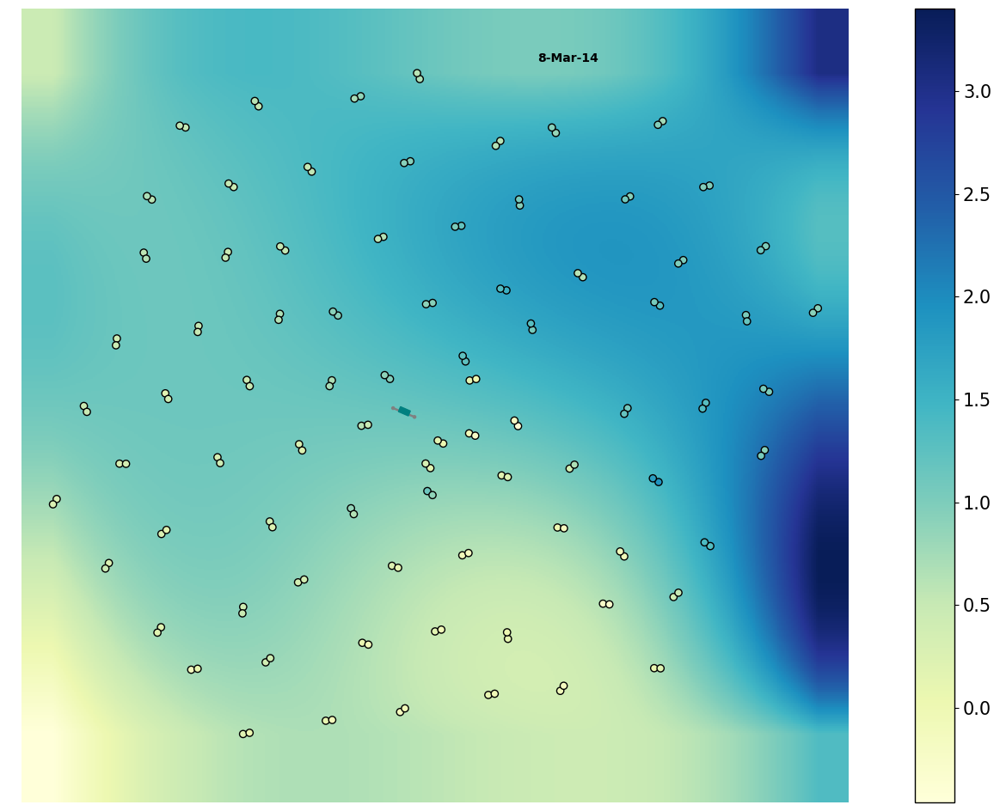

In [10]:
fs=15

fig = plt.figure(figsize=(16,12))
ax = plt.subplot()
ax.text(180, 520, snow.iloc[:,meas_index].name, weight='bold')
sc = plt.pcolormesh(X, Y, sbs.ev(X, Y), shading='auto', cmap='YlGnBu')
ax.scatter(snow.X, snow.Y, c=snow.iloc[:,meas_index], edgecolor='black', cmap="YlGnBu", vmin=0, vmax=4.6)
plot_ICL(ax)
ax.axis('equal')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.spines.bottom.set_visible(False)
ax.spines.left.set_visible(False)
ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.grid(False)
cb = fig.colorbar(sc)

plt.show()

### ... or with cubic interpolation

In [11]:
from scipy.interpolate import griddata

meas_index = 22

X = np.linspace(-600, 600, 1200)
Y = np.linspace(-600, 600, 1200)
X, Y = np.meshgrid(X, Y)

interpol_cubic = griddata((snow.X, snow.Y), snow.iloc[:,meas_index], (X, Y), method='cubic')

/tmp/ipykernel_412/1102842445.py:8: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolormesh(X, Y, interpol_cubic, shading='auto', cmap='YlGnBu', vmin=0.0, vmax=highest_snow)
/tmp/ipykernel_412/1102842445.py:13: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc)


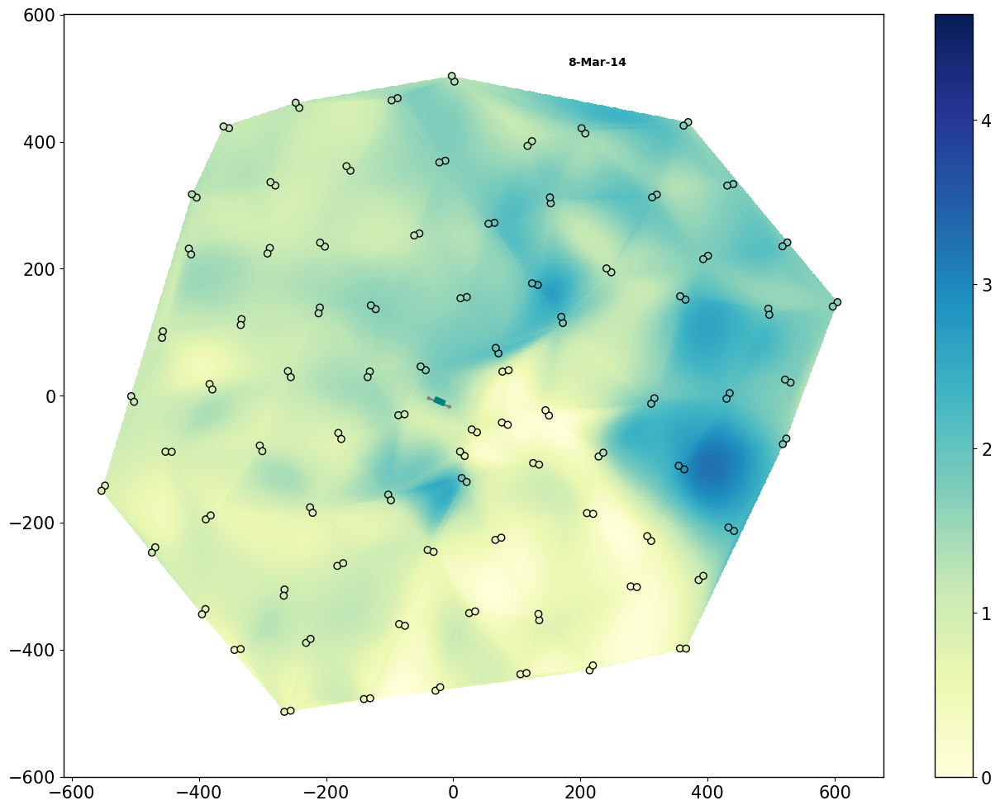

In [12]:
fs=15
highest_snow = max(snow.iloc[:,16:].values[~np.isnan(snow.iloc[:,16:])])

fig = plt.figure(figsize=(16,12))
ax = plt.subplot()
ax.text(180, 520, snow.iloc[:,meas_index].name, weight='bold')

plt.pcolormesh(X, Y, interpol_cubic, shading='auto', cmap='YlGnBu', vmin=0.0, vmax=highest_snow)
sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,meas_index], edgecolor='black', cmap="YlGnBu", vmin=0.0, vmax=highest_snow)
plot_ICL(ax)
ax.axis('equal')
ax.grid(False)
cb = fig.colorbar(sc)

plt.show()

### However, it gets more reasonable when using the averaged values for the stations

In [13]:
from scipy.interpolate import griddata

ind = meas_index - 12 # this should be the offset when comparing the snow with the snow_avg dataframe

X = np.linspace(-600, 600, 1200)
Y = np.linspace(-600, 600, 1200)
X, Y = np.meshgrid(X, Y)

interpol_cubic = griddata((snow_avg.X, snow_avg.Y), snow_avg.iloc[:,ind], (X, Y), method='cubic')

/tmp/ipykernel_412/3341167255.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolormesh(X, Y, interpol_cubic, shading='auto', cmap='YlGnBu', vmin=0.0, vmax=highest_snow)
/tmp/ipykernel_412/3341167255.py:12: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc)


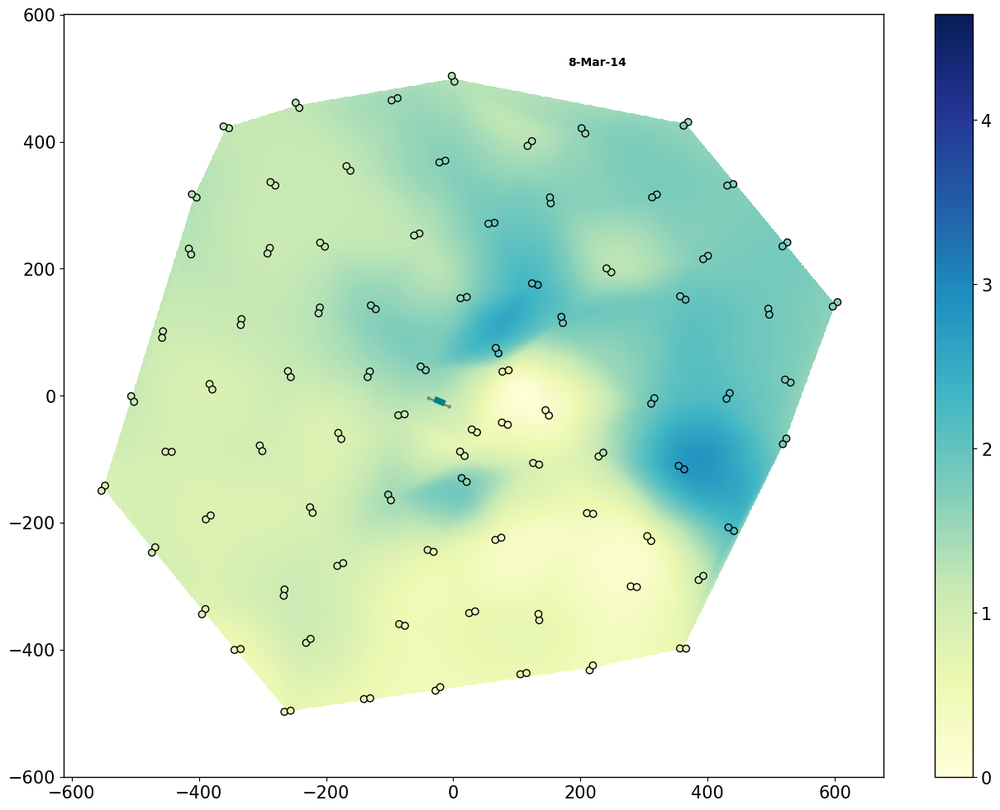

In [14]:
fs=15

fig = plt.figure(figsize=(16,12))
ax = plt.subplot()

ax.text(180, 520, snow_avg.iloc[:,ind].name, weight='bold')
plt.pcolormesh(X, Y, interpol_cubic, shading='auto', cmap='YlGnBu', vmin=0.0, vmax=highest_snow)
sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,meas_index], edgecolor='black', cmap="YlGnBu", vmin=0.0, vmax=highest_snow)
plot_ICL(ax)
ax.axis('equal')
ax.grid(False)
cb = fig.colorbar(sc)

plt.show()

## Map of all the snow maesurements since 2012

/tmp/ipykernel_412/3060365525.py:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc, cax=cbar_ax)


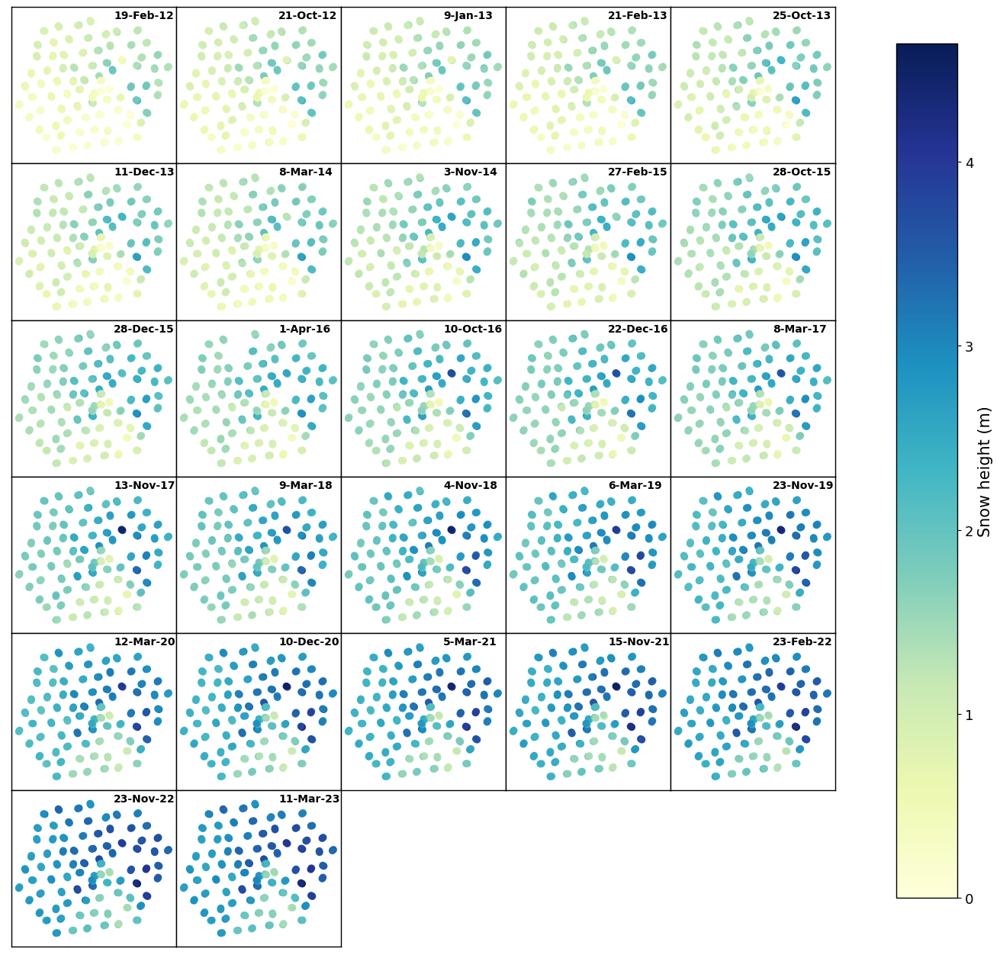

In [15]:
fs=15

fig = plt.figure(figsize=(16,16))
axs = [plt.subplot(6,5,i+1) for i in range(27)]
i=0

for ax in axs:
    ax.text(180, 520, snow.iloc[:,16+i].name, weight='bold')
    #plot_ICL(ax)
    sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,16+i], cmap="YlGnBu", vmin=0.0, vmax=highest_snow)
    ax.axis('equal')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.grid(False)
    i+=1

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
cb = fig.colorbar(sc, cax=cbar_ax)
cb.set_label(label='Snow height (m)', size=fs)
cb.ax.tick_params(labelsize=fs-2)

plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## .. with the interpolations:

/tmp/ipykernel_586/147018251.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  ax.pcolormesh(X, Y, griddata((snow_avg.X[~np.isnan(snow_avg.iloc[:,4+i])], snow_avg.Y[~np.isnan(snow_avg.iloc[:,4+i])]), snow_avg.iloc[:,4+i][~np.isnan(snow_avg.iloc[:,4+i])], (X, Y), method='cubic'), shading='auto', cmap='pink_r', vmin=0.0, vmax=highest_snow)
/tmp/ipykernel_586/147018251.py:22: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc, cax=cbar_ax)


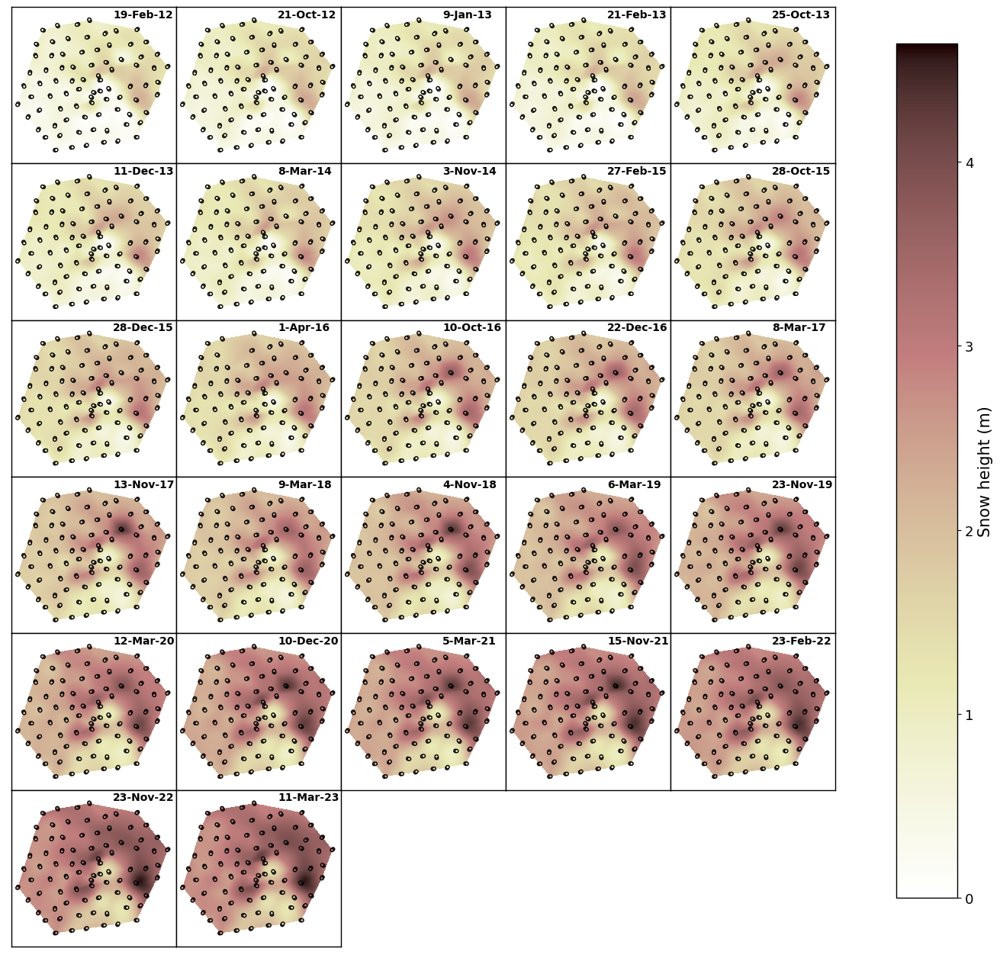

In [16]:
fs=15

fig = plt.figure(figsize=(16,16))
axs = [plt.subplot(6,5,i+1) for i in range(27)]
i=0

for ax in axs:
    ax.text(180, 520, snow.iloc[:,16+i].name, weight='bold')
    #plot_ICL(ax)
    ax.pcolormesh(X, Y, griddata((snow_avg.X[~np.isnan(snow_avg.iloc[:,4+i])], snow_avg.Y[~np.isnan(snow_avg.iloc[:,4+i])]), snow_avg.iloc[:,4+i][~np.isnan(snow_avg.iloc[:,4+i])], (X, Y), method='cubic'), shading='auto', cmap='pink_r', vmin=0.0, vmax=highest_snow)
    sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,16+i], cmap="pink_r", edgecolor='black', s=10, vmin=0.0, vmax=highest_snow)
    ax.axis('equal')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.grid(False)
    i+=1

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
cb = fig.colorbar(sc, cax=cbar_ax)
cb.set_label(label='Snow height (m)', size=fs)
cb.ax.tick_params(labelsize=fs-2)

plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig('/data/user/jsaffer/Plots/snow_maps_interpol.png', dpi=300)
plt.show()

In [16]:
def EN_to_ICcoords(easting, northing):
    return 0.3048*(easting-46500), 0.3048*(northing-52200)

MAPO_x, MAPO_y = EN_to_ICcoords(47723.74, 52529.27)
SPASE2_x, SPASE2_y = EN_to_ICcoords(47170.48, 51431.14)
DSL_x, DSL_y = EN_to_ICcoords(47282.46, 52999.62)
INAN1_x, INAN1_y = EN_to_ICcoords(44415.56, 53911.63)
WP09_7_x, WP09_7_y = EN_to_ICcoords(46904.98, 49860.18)
WP10_7_x, WP10_7_y = EN_to_ICcoords(45082.74, 51293.90)
WP10_8_x, WP10_8_y = EN_to_ICcoords(45544.06, 52586.56)

DSL_alt_x, DSL_alt_y = 276.563, 216.807
MAPO_alt_x, MAPO_alt_y = 390, 70

SPT_x, SPT_y = 192.6112, 269.4301 # from the old snow map plotting script https://docushare.icecube.wisc.edu/dsweb/Get/Document-78946/plot_Snow.C
B61_x, B61_y = 244, 80

/tmp/ipykernel_412/2742390918.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  ax.pcolormesh(X, Y, griddata((snow_avg.X[~np.isnan(snow_avg.iloc[:,4+i])], snow_avg.Y[~np.isnan(snow_avg.iloc[:,4+i])]), snow_avg.iloc[:,4+i][~np.isnan(snow_avg.iloc[:,4+i])], (X, Y), method='cubic'), shading='auto', cmap=colormap, vmin=0.0, vmax=highest_snow)
/tmp/ipykernel_412/2742390918.py:20: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = fig.colorbar(sc)
/tmp/ipykernel_412/2742390918.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcPara

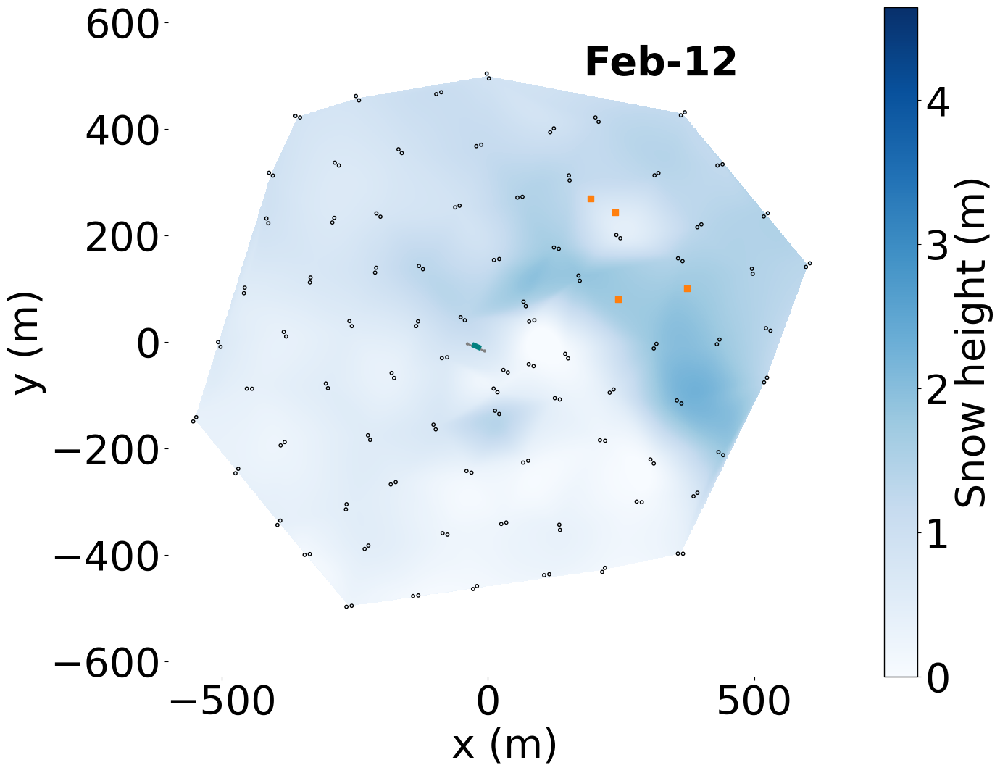

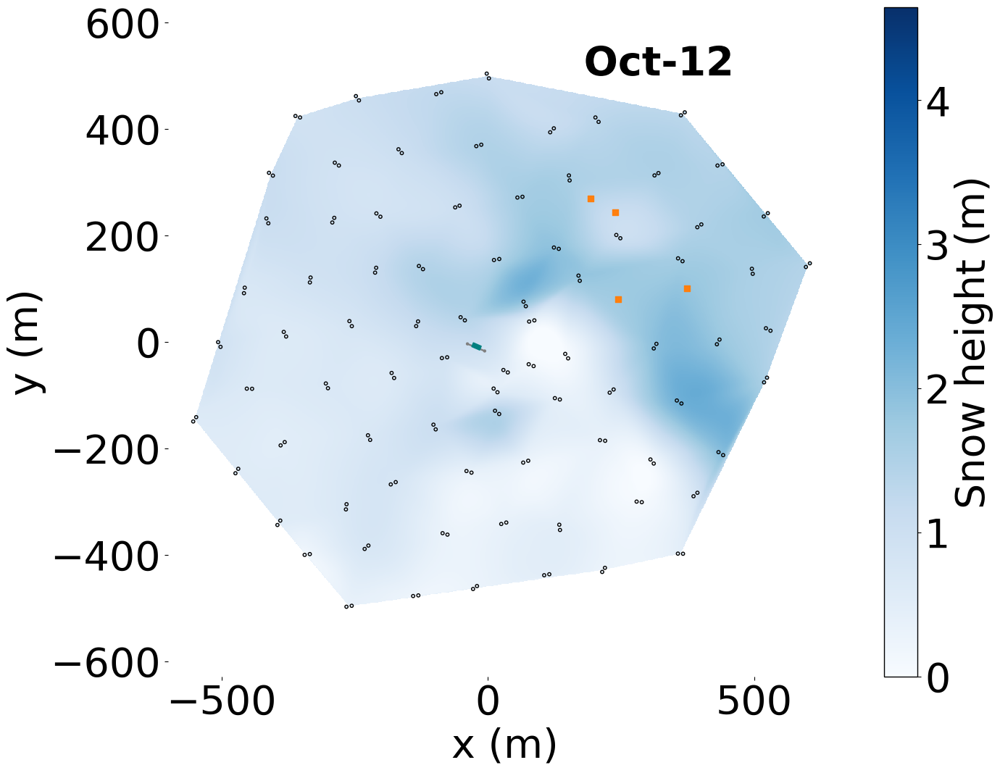

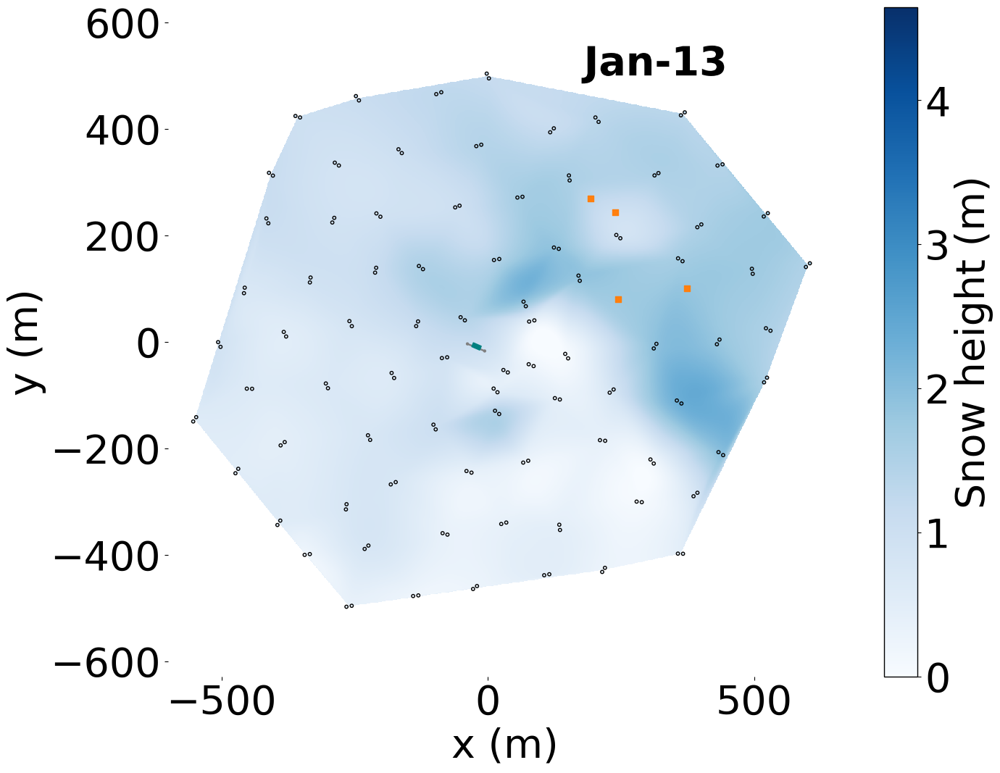

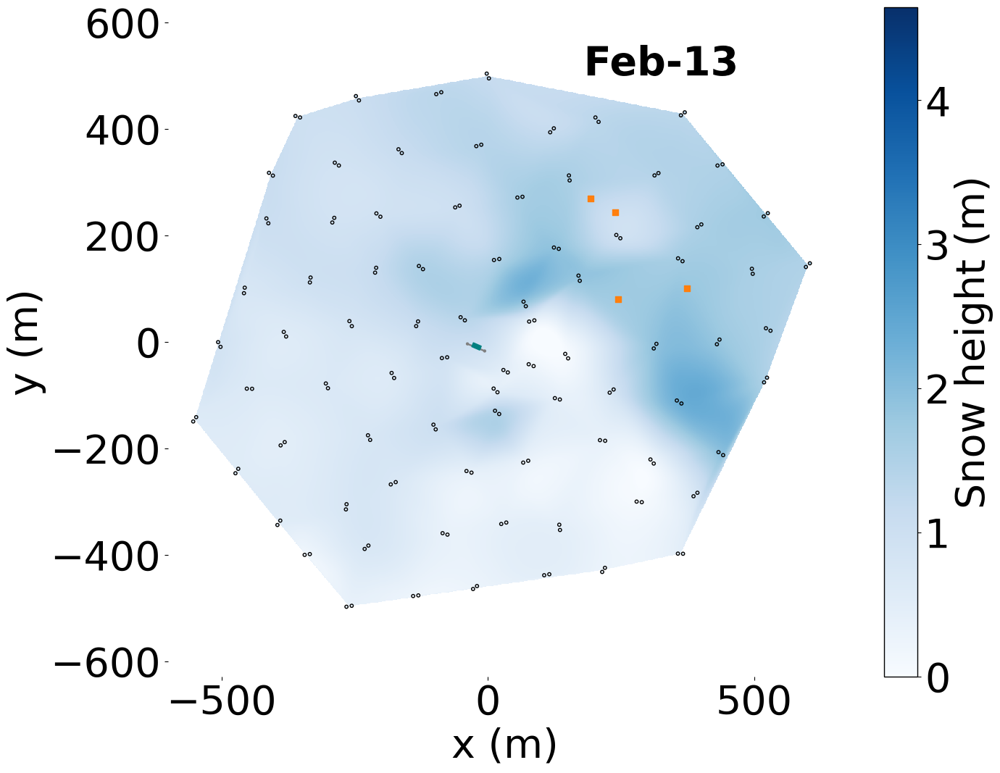

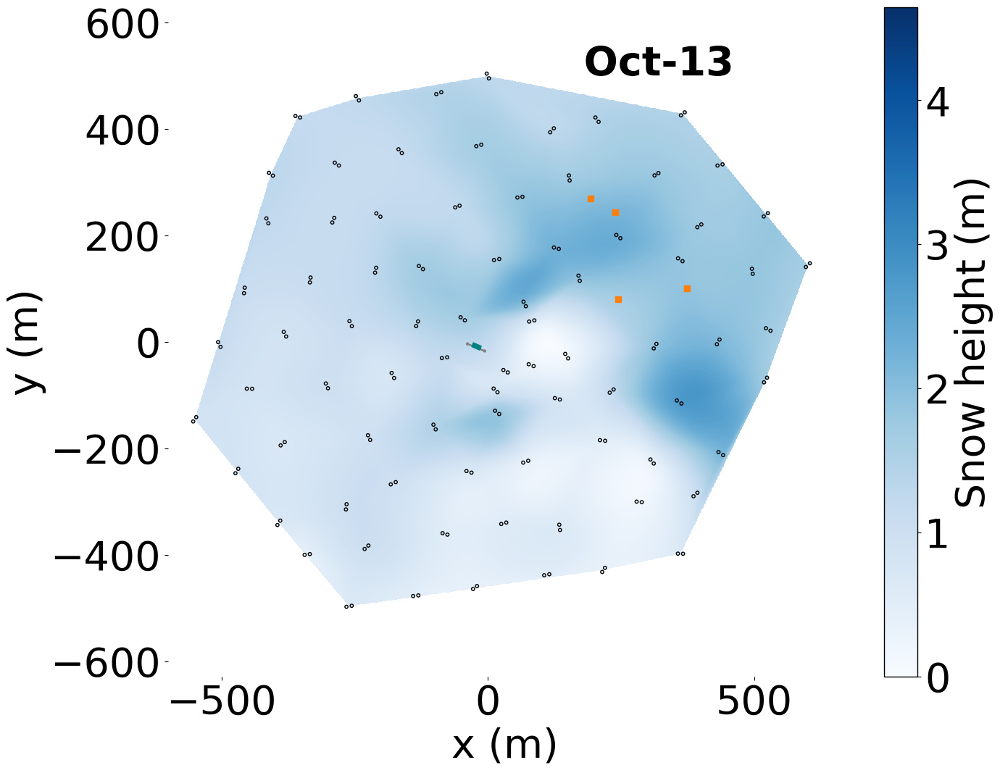

...

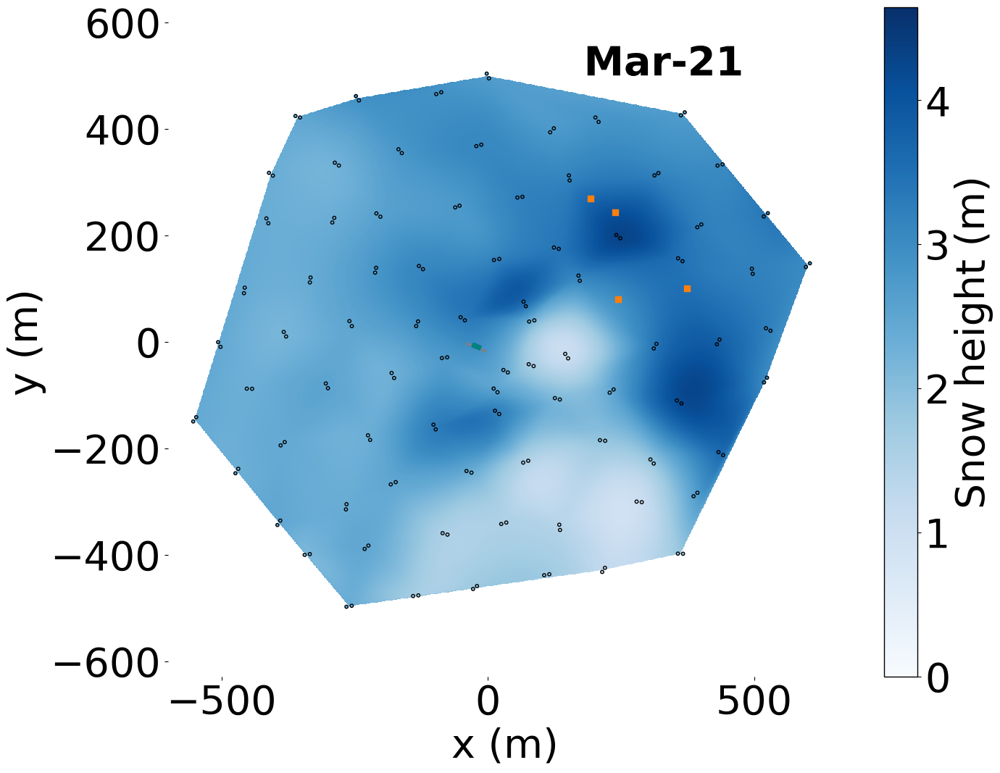

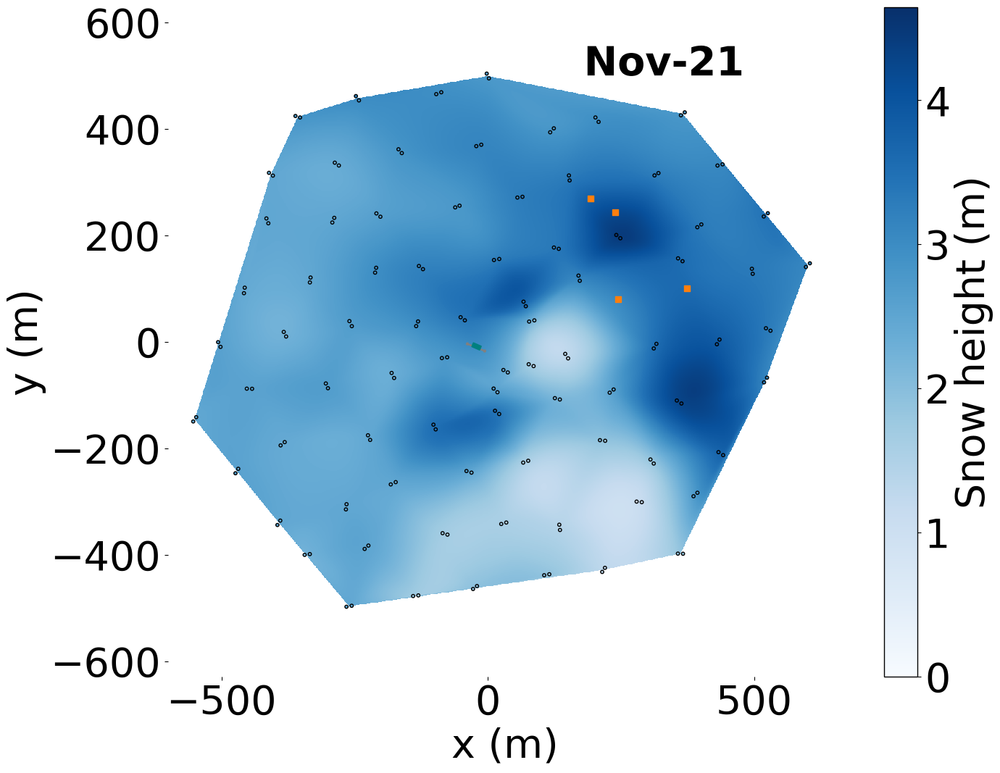

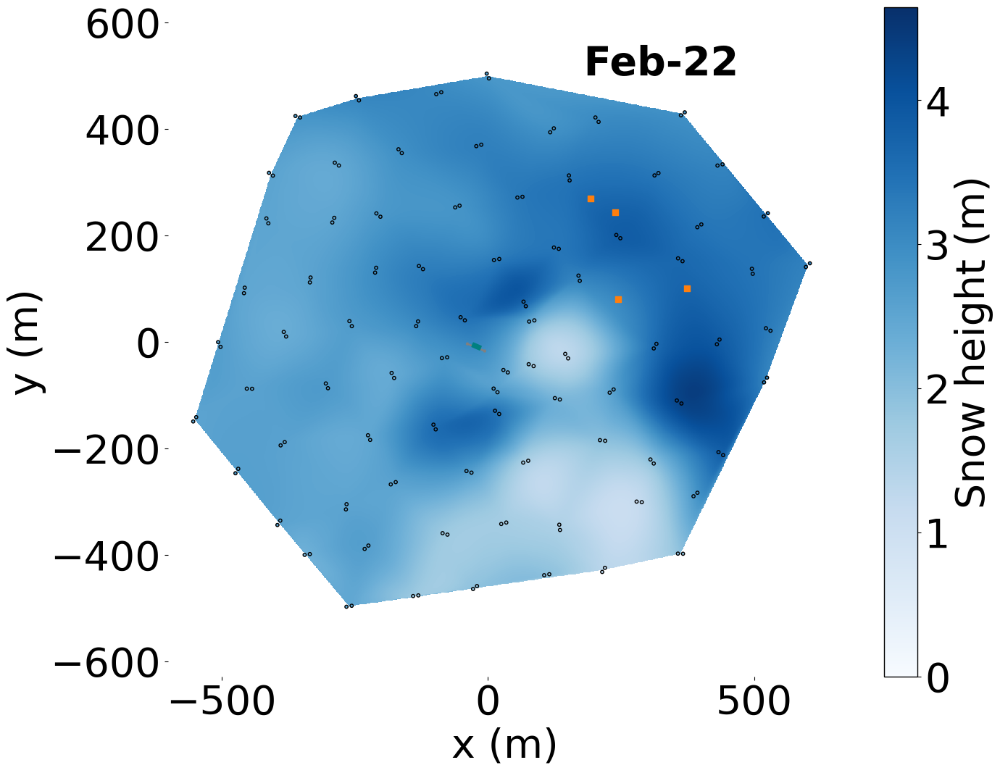

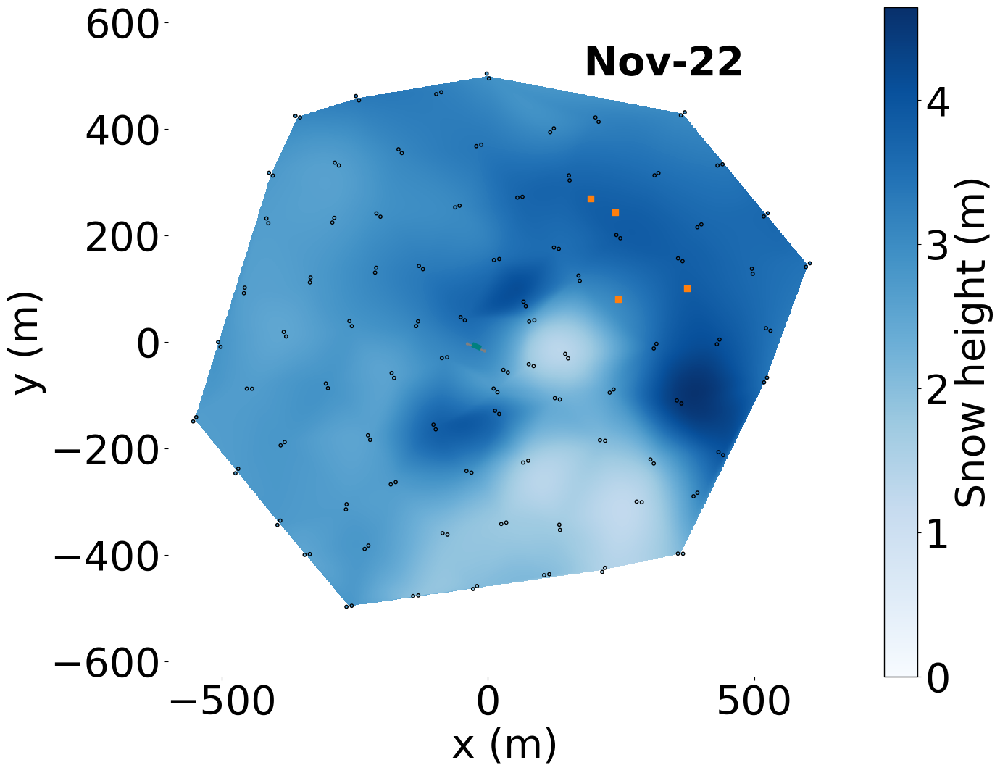

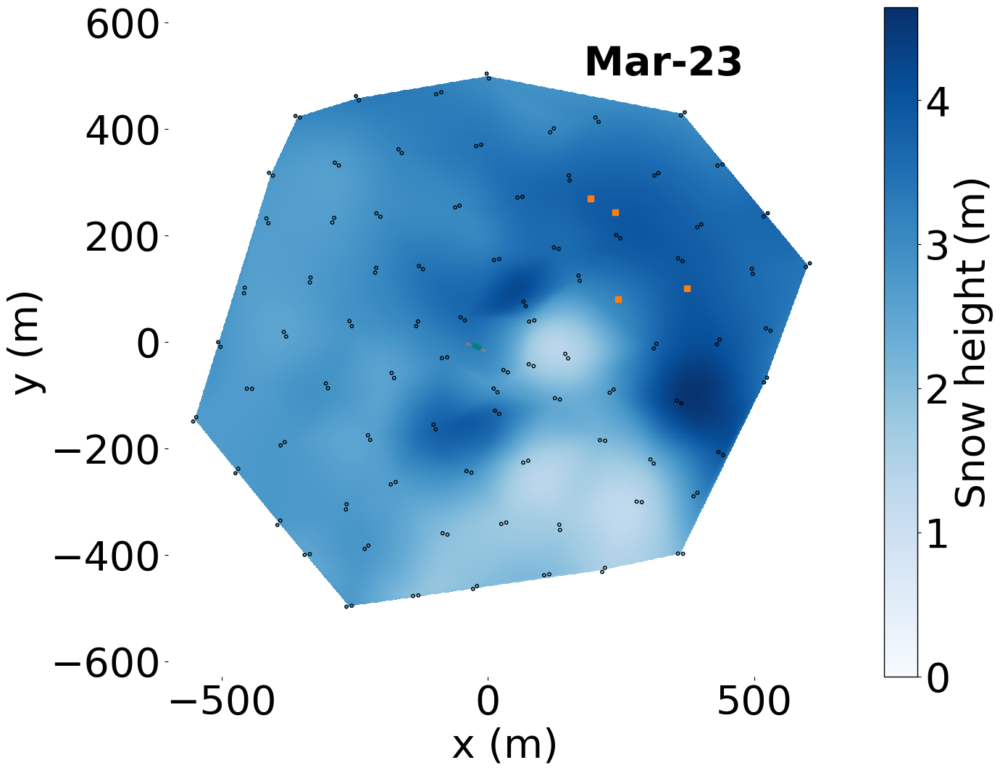

In [17]:
import matplotlib.patheffects as PathEffects

fs=40

colormap = 'Blues'

for i in range(27):
    fig = plt.figure(figsize=(15,12))
    ax = plt.subplot()
    ax.pcolormesh(X, Y, griddata((snow_avg.X[~np.isnan(snow_avg.iloc[:,4+i])], snow_avg.Y[~np.isnan(snow_avg.iloc[:,4+i])]), snow_avg.iloc[:,4+i][~np.isnan(snow_avg.iloc[:,4+i])], (X, Y), method='cubic'), shading='auto', cmap=colormap, vmin=0.0, vmax=highest_snow)
    sc = ax.scatter(snow.X, snow.Y, c=snow.iloc[:,16+i], cmap=colormap, edgecolor='black', s=10, vmin=0.0, vmax=highest_snow)
    if snow.columns[16+i] == '1-Apr-16': # in April 2016 three stations didn't get snow height measurements, so I need to plot the outlines of the tanks separately
        ax.scatter(snow.X[70], snow.Y[70], facecolor='white', edgecolor='black', s=10)
        ax.scatter(snow.X[71], snow.Y[71], facecolor='white', edgecolor='black', s=10)
        ax.scatter(snow.X[138], snow.Y[138], facecolor='white', edgecolor='black', s=10)
        ax.scatter(snow.X[139], snow.Y[139], facecolor='white', edgecolor='black', s=10)
        ax.scatter(snow.X[152], snow.Y[152], facecolor='white', edgecolor='black', s=10)
        ax.scatter(snow.X[153], snow.Y[153], facecolor='white', edgecolor='black', s=10)
    ax.axis('equal')
    cb = fig.colorbar(sc)
    cb.set_label(label='Snow height (m)', size=fs)
    cb.ax.tick_params(labelsize=fs)
    plot_ICL(ax)
    ax.scatter(MAPO_x, MAPO_y, marker='s', color='C1')
    ax.scatter(DSL_x, DSL_y, marker='s', color='C1')
    #ax.scatter(MAPO_alt_x, MAPO_alt_y, marker='^', color='C5')
    #ax.scatter(DSL_alt_x, DSL_alt_y, marker='v', color='C5')
    ax.scatter(SPT_x, SPT_y, marker='s', color='C1')
    ax.scatter(B61_x, B61_y, marker='s', color='C1')
    #txt = ax.text(180, 500, snow.iloc[:,16+i].name, weight='bold', fontsize=fs)
    txt = ax.text(180, 500, snow.iloc[:,16+i].name[-6:], weight='bold', fontsize=fs) # for Kath only the month and year
    txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='white')])
    #ax.set_xticklabels([])
    #ax.set_yticklabels([])
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.xaxis.set_tick_params(labelsize=fs)
    ax.yaxis.set_tick_params(labelsize=fs)
    ax.set_xlabel('x (m)', fontsize=fs)
    ax.set_ylabel('y (m)', fontsize=fs)
    ax.spines.bottom.set_visible(False)
    ax.spines.left.set_visible(False)
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)
    ax.grid(False)
    #plt.savefig(f'/data/user/jsaffer/Plots/snow_maps/snow_map_data_{i}_interpol.png', dpi=400)
    plt.savefig(f'/data/user/jsaffer/Plots/snow_maps/snow_map_data_{i}_interpol_shefali_version.png', bbox_inches='tight', dpi=400)
    #plt.savefig(f'/data/user/jsaffer/Plots/snow_maps/snow_map_data_{i}_interpol_kath.pdf', bbox_inches='tight', dpi=300)